<a href="https://colab.research.google.com/github/Sanika301/Airbnb-clone/blob/main/MiniProject_FreeCodeCamp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!kaggle datasets download -d farzadnekouei/50k-celebrity-faces-image-dataset

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.10/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.10/dist-packages/kaggle/api/kaggle_api_extended.py", line 403, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.


In [ ]:
# !pip install -q kaggle
# !mkdir ~/.kaggle
# !cp kaggle.json ~/.kaggle/
# !chmod 600 /root/.kaggle/kaggle.json
# !kaggle datasets download -d farzadnekouei/50k-celebrity-faces-image-dataset
!unzip "/content/2DSagittal" -d "/content/dataset"

Archive:  /content/2DSagittal.zip
   creating: /content/dataset/2DSagittal/
   creating: /content/dataset/2DSagittal/CN/
  inflating: /content/dataset/2DSagittal/CN/image_2431.jpg  
  inflating: /content/dataset/2DSagittal/CN/image_2446.jpg  
  inflating: /content/dataset/2DSagittal/CN/image_2401.jpg  
  inflating: /content/dataset/2DSagittal/CN/image_2393.jpg  
  inflating: /content/dataset/2DSagittal/CN/image_2416.jpg  
  inflating: /content/dataset/2DSagittal/CN/image_2389.jpg  
  inflating: /content/dataset/2DSagittal/CN/image_2387.jpg  
  inflating: /content/dataset/2DSagittal/CN/image_2392.jpg  
  inflating: /content/dataset/2DSagittal/CN/image_2391.jpg  
  inflating: /content/dataset/2DSagittal/CN/image_2382.jpg  
  inflating: /content/dataset/2DSagittal/CN/image_2390.jpg  
  inflating: /content/dataset/2DSagittal/CN/image_2384.jpg  
  inflating: /content/dataset/2DSagittal/CN/image_2381.jpg  
  inflating: /content/dataset/2DSagittal/CN/image_2385.jpg  
  inflating: /content/dat

In [ ]:
BATCH_SIZE=128
IM_SHAPE=(64,64,3)
LEARNING_RATE=2e-4

In [ ]:

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import (Reshape,LeakyReLU,Dropout,Conv2DTranspose, Add, Conv2D, MaxPool2D, Dense,
                                     Flatten, InputLayer, BatchNormalization, Input, )
from tensorflow.keras.optimizers import Adam

In [ ]:
BATCH_SIZE = 128
IM_SHAPE = (64,64,3)
LEARNING_RATE = 2e-4
LATENT_DIM=100
EPOCHS=20

In [ ]:
dataset= tf.keras.preprocessing.image_dataset_from_directory(
    "/content/dataset/2DSagittal/AD", label_mode=None, image_size=(IM_SHAPE[0], IM_SHAPE[1]), batch_size=32
)

Found 1113 files belonging to 1 classes.


In [ ]:
dataset

<_PrefetchDataset element_spec=TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None)>

In [ ]:
def preprocess(image):
  return tf.cast(image, tf.float32) / 127.5 - 1.0

In [ ]:
train_dataset = (
    dataset
    .map(preprocess)
    .unbatch()
    .shuffle(buffer_size = 1024, reshuffle_each_iteration = True)
    .batch(BATCH_SIZE,drop_remainder=True)
    .prefetch(tf.data.AUTOTUNE)
)

In [ ]:
for d in train_dataset.take(1):
  print(d.shape)

(128, 64, 64, 3)


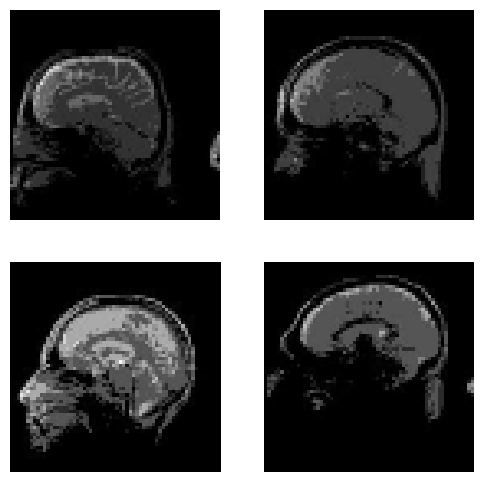

In [ ]:
plt.figure(figsize = (6,6))
k=0
n = 4
for i in range(n):
  ax = plt.subplot(2,2, k+1)
  plt.imshow((d[i]+1)/2)
  plt.axis("off")
  k+=1

In [ ]:
generator=tf.keras.Sequential([
  Input(shape=(LATENT_DIM,)),
  Dense(4*4*LATENT_DIM),
  Reshape((4,4,LATENT_DIM)),

  Conv2DTranspose(512,kernel_size=4,strides=2, padding='same'),
  BatchNormalization(),
  LeakyReLU(0.2),

  Conv2DTranspose(256,kernel_size=4,strides=2, padding='same'),
  BatchNormalization(),
  LeakyReLU(0.2),

  Conv2DTranspose(128,kernel_size=4,strides=2, padding='same'),
  BatchNormalization(),
  LeakyReLU(0.2),

  Conv2DTranspose(3,kernel_size=4,strides=2, activation=tf.keras.activations.tanh, padding='same'),

],name='generator')


In [ ]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1600)              161600    
                                                                 
 reshape (Reshape)           (None, 4, 4, 100)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 8, 8, 512)         819712    
 anspose)                                                        
                                                                 
 batch_normalization (Batch  (None, 8, 8, 512)         2048      
 Normalization)                                                  
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose_1 (Conv2D  (None, 16, 16, 256)       20

In [ ]:
discriminator=tf.keras.Sequential([
  Input(shape=(IM_SHAPE[0],IM_SHAPE[1],3)),

  Conv2D(64,kernel_size=4,strides=2, padding='same'),
  LeakyReLU(0.2),

  Conv2D(128,kernel_size=4,strides=2, padding='same'),
  BatchNormalization(),
  LeakyReLU(0.2),

  Conv2D(256,kernel_size=4,strides=2, padding='same'),
  BatchNormalization(),
  LeakyReLU(0.2),

  Conv2D(1,kernel_size=4,strides=2, padding='same'),

  Flatten(),
  Dense(1,activation='sigmoid')


],name='discriminator')


In [ ]:
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 batch_normalization_3 (Bat  (None, 16, 16, 128)       512       
 chNormalization)                                                
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 256)         524544    
                                                     

In [ ]:
class ShowImage(tf.keras.callbacks.Callback):
    def __init__(self, latent_dim=100):
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        n=6
        k=0
        out=self.model.generator(tf.random.normal(shape=(36, self.latent_dim)))
        plt.figure(figsize=(16,16))
        for i in range(n):
          for j in range(n):
            ax=plt.subplot(n,n,k+1)
            plt.imshow((out[k]+1)/2,)
            plt.axis('off')
            k+=1
        plt.savefig("generated/gen_images_epoch_{}.png".format(epoch+1))


In [ ]:
class GAN(tf.keras.Model):
  def __init__(self,discriminator,generator):
    super(GAN,self).__init__()
    self.discriminator=discriminator
    self.generator=generator

  def compile(self,d_optimizer,g_optimizer,loss_fn):
    super(GAN,self).compile()
    self.d_optimizer=d_optimizer
    self.g_optimizer=g_optimizer
    self.loss_fn=loss_fn
    self.d_loss_metric=tf.keras.metrics.Mean(name='d_loss')
    self.g_loss_metric=tf.keras.metrics.Mean(name='g_loss')

  @property
  def metrics(self):
    return [self.d_loss_metric,self.g_loss_metric]

  def train_step(self,real_images):
    batch_size=tf.shape(real_images)[0]

    ######## Discriminator
    random_noise=tf.random.normal(shape=(batch_size,LATENT_DIM))
    fake_images=self.generator(random_noise)

    real_labels=tf.ones((batch_size,1))+0.25*tf.random.uniform((batch_size,1),minval=-1,maxval=1)
    fake_labels=tf.zeros((batch_size,1))+0.25*tf.random.uniform((batch_size,1),)

    with tf.GradientTape() as recorder:
      real_predictions=self.discriminator(real_images)
      d_loss_real=self.loss_fn(real_labels,real_predictions)

      fake_predictions=self.discriminator(fake_images)
      d_loss_fake=self.loss_fn(fake_labels,fake_predictions)

      d_loss=d_loss_real+d_loss_fake

    partial_derivatives = recorder.gradient(d_loss,self.discriminator.trainable_weights)
    self.d_optimizer.apply_gradients(zip(partial_derivatives, self.discriminator.trainable_weights))

    ############# Generator
    random_noise=tf.random.normal(shape=(batch_size,LATENT_DIM))
    flipped_fake_labels=tf.ones((batch_size,1))

    with tf.GradientTape() as recorder:

      fake_predictions=self.discriminator(self.generator(random_noise))
      g_loss=self.loss_fn(flipped_fake_labels,fake_predictions)

    partial_derivatives = recorder.gradient(g_loss,self.generator.trainable_weights)
    self.g_optimizer.apply_gradients(zip(partial_derivatives, self.generator.trainable_weights))

    self.d_loss_metric.update_state(d_loss)
    self.g_loss_metric.update_state(g_loss)

    return {'d_loss':self.d_loss_metric.result(),
            'g_loss':self.g_loss_metric.result()}

In [ ]:
gan=GAN(discriminator,generator)
gan.compile(
    d_optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE,beta_1=0.5),
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE,beta_1=0.5),
    loss_fn=tf.keras.losses.BinaryCrossentropy(),
)

In [ ]:
!mkdir generated

Epoch 1/1000
      6/Unknown - 8s 52ms/step - d_loss: 1.0054 - g_loss: 0.6432

8/8 [==============================] - 10s 316ms/step - d_loss: 1.0041 - g_loss: 0.6083
Epoch 2/1000
8/8 [==============================] - 2s 240ms/step - d_loss: 1.0623 - g_loss: 0.7324
Epoch 3/1000
8/8 [==============================] - 2s 278ms/step - d_loss: 0.8239 - g_loss: 1.1288
Epoch 4/1000
8/8 [==============================] - 2s 275ms/step - d_loss: 0.8386 - g_loss: 0.7706
Epoch 5/1000
8/8 [==============================] - 2s 314ms/step - d_loss: 0.8468 - g_loss: 0.8391
Epoch 6/1000
8/8 [==============================] - 2s 266ms/step - d_loss: 1.2483 - g_loss: 0.9045
Epoch 7/1000
8/8 [==============================] - 2s 265ms/step - d_loss: 0.8667 - g_loss: 0.8328
Epoch 8/1000
8/8 [==============================] - 2s 317ms/step - d_loss: 0.8630 - g_loss: 0.8932
Epoch 9/1000
8/8 [==============================] - 2s 272ms/step - d_loss: 1.0023 - g_loss: 1.0016
Epoch 10/1000
8/8 [==============================] - 2s 280ms/step - d_loss: 1.1657 - g_loss: 0.9923
Epoch 11/10

<ipython-input-19-12a0bc30a97a>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(16,16))


8/8 [==============================] - 2s 255ms/step - d_loss: 1.2710 - g_loss: 0.7971
Epoch 22/1000
8/8 [==============================] - 2s 241ms/step - d_loss: 1.2413 - g_loss: 0.7973
Epoch 23/1000
8/8 [==============================] - 2s 340ms/step - d_loss: 1.2809 - g_loss: 0.7790
Epoch 24/1000
8/8 [==============================] - 2s 238ms/step - d_loss: 1.2829 - g_loss: 0.7932
Epoch 25/1000
8/8 [==============================] - 2s 233ms/step - d_loss: 1.2558 - g_loss: 0.7625
Epoch 26/1000
8/8 [==============================] - 2s 247ms/step - d_loss: 1.2910 - g_loss: 0.7805
Epoch 27/1000
8/8 [==============================] - 2s 251ms/step - d_loss: 1.3176 - g_loss: 0.7428
Epoch 28/1000
8/8 [==============================] - 2s 238ms/step - d_loss: 1.1766 - g_loss: 0.8559
Epoch 29/1000
8/8 [==============================] - 2s 240ms/step - d_loss: 1.3098 - g_loss: 0.7164
Epoch 30/1000
8/8 [==============================] - 3s 345ms/step - d_loss: 1.2537 - g_loss: 0.8400
Epoc

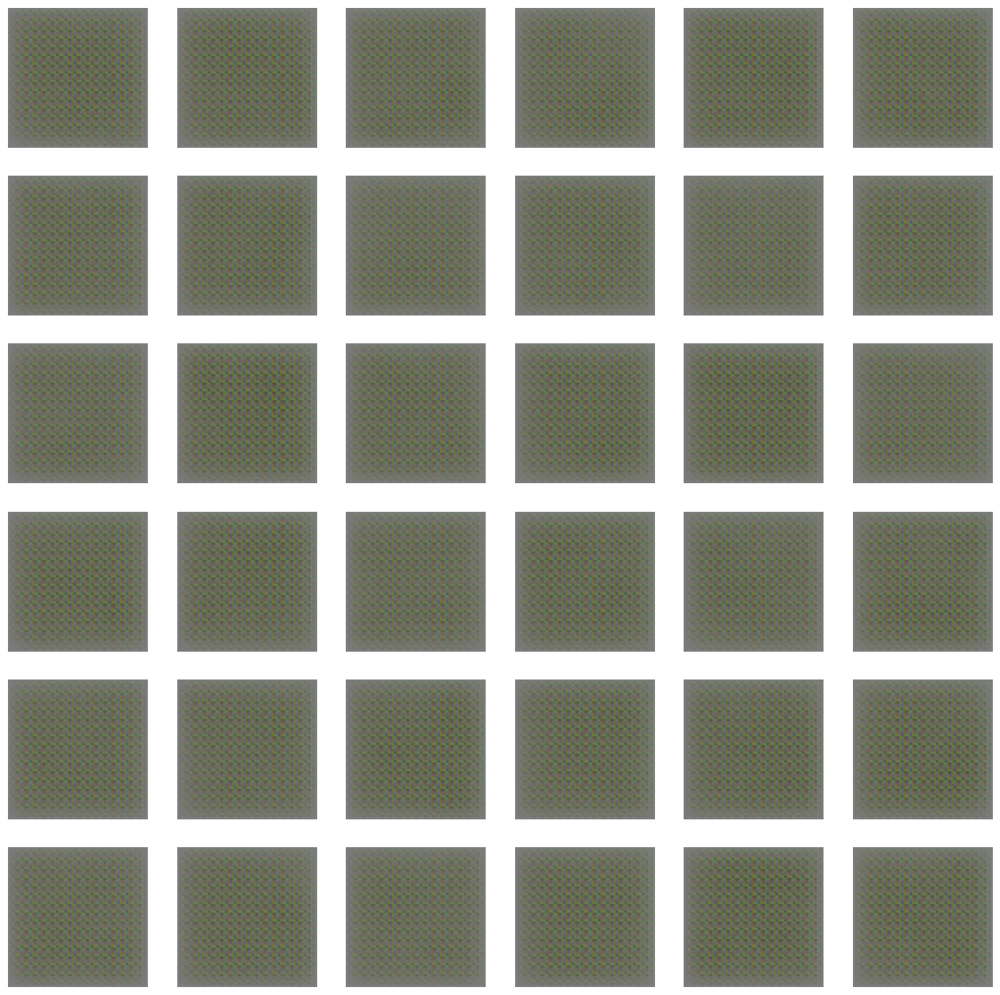

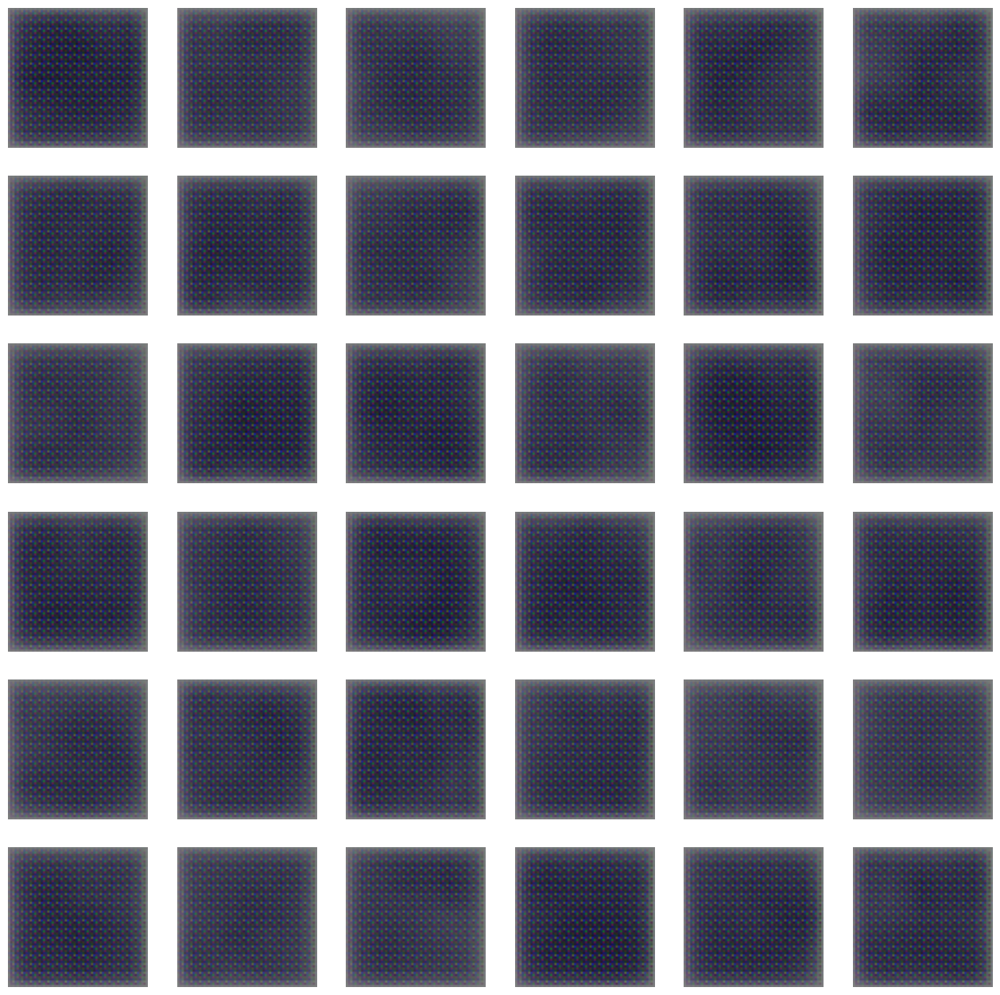

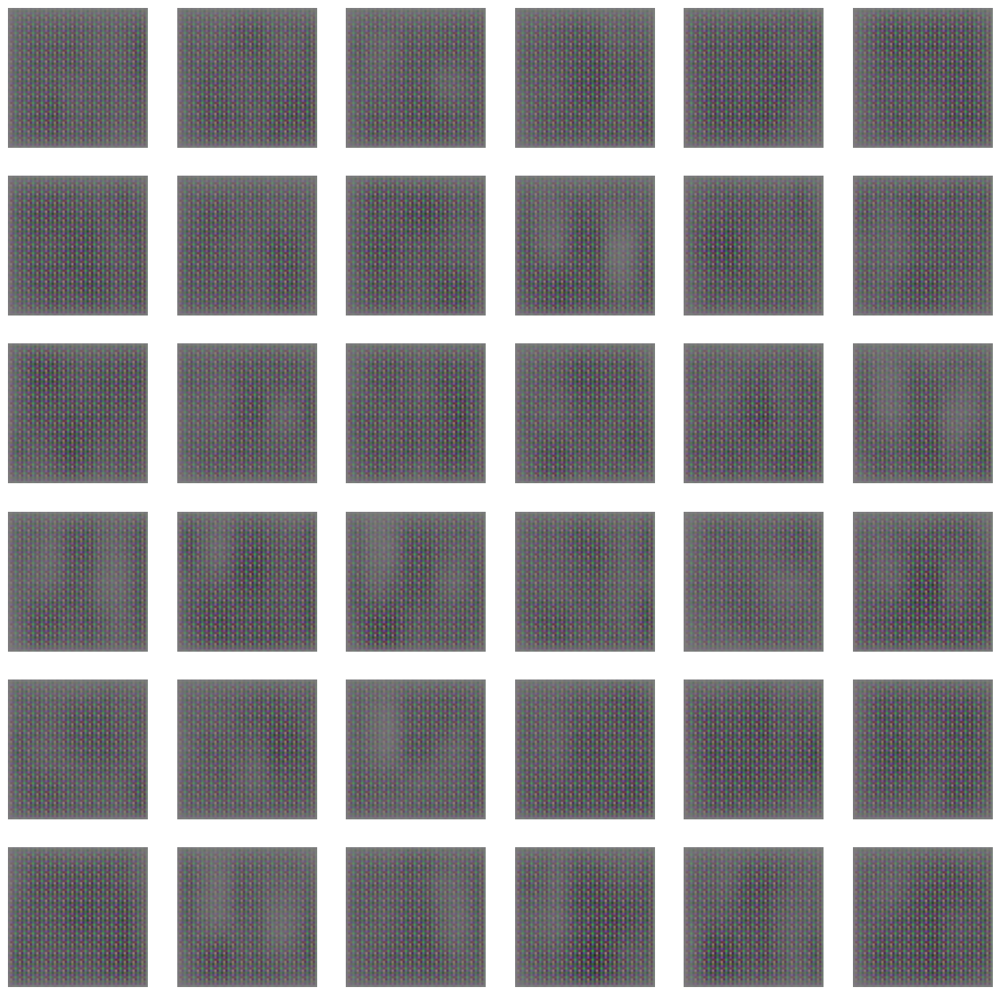

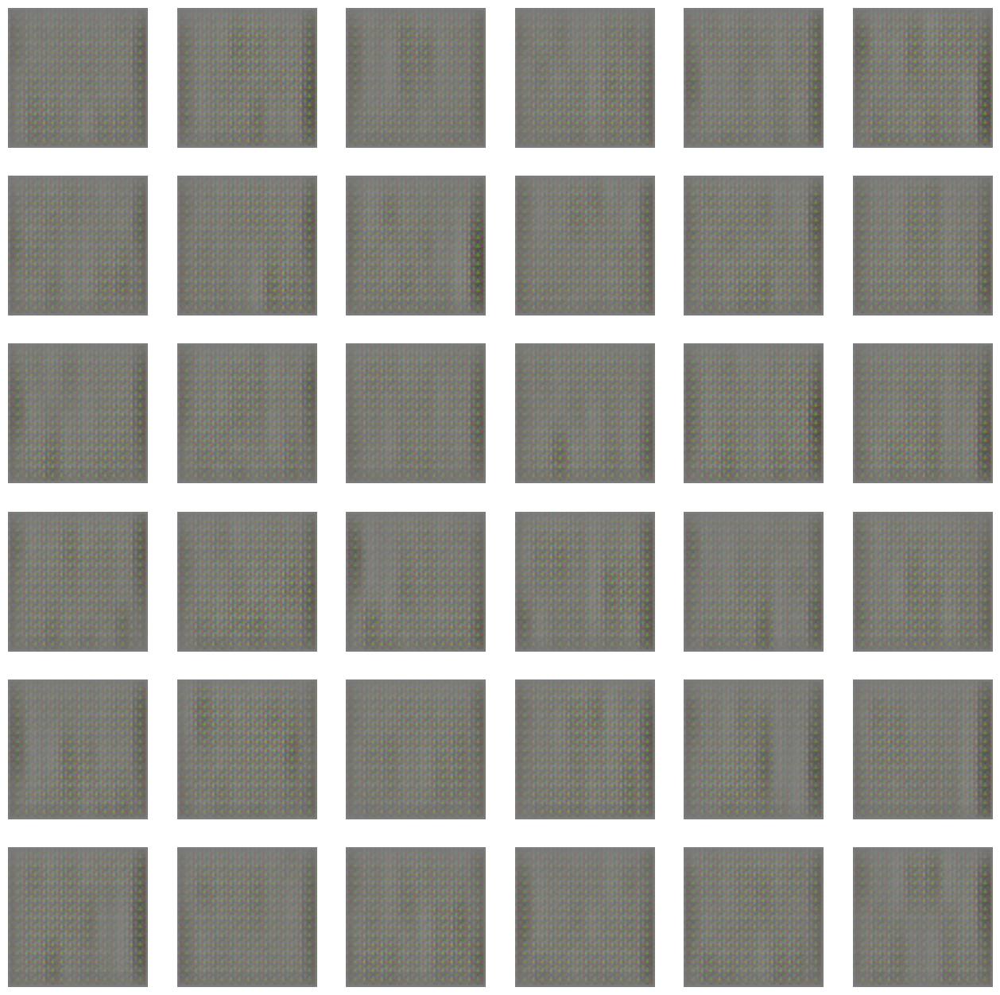

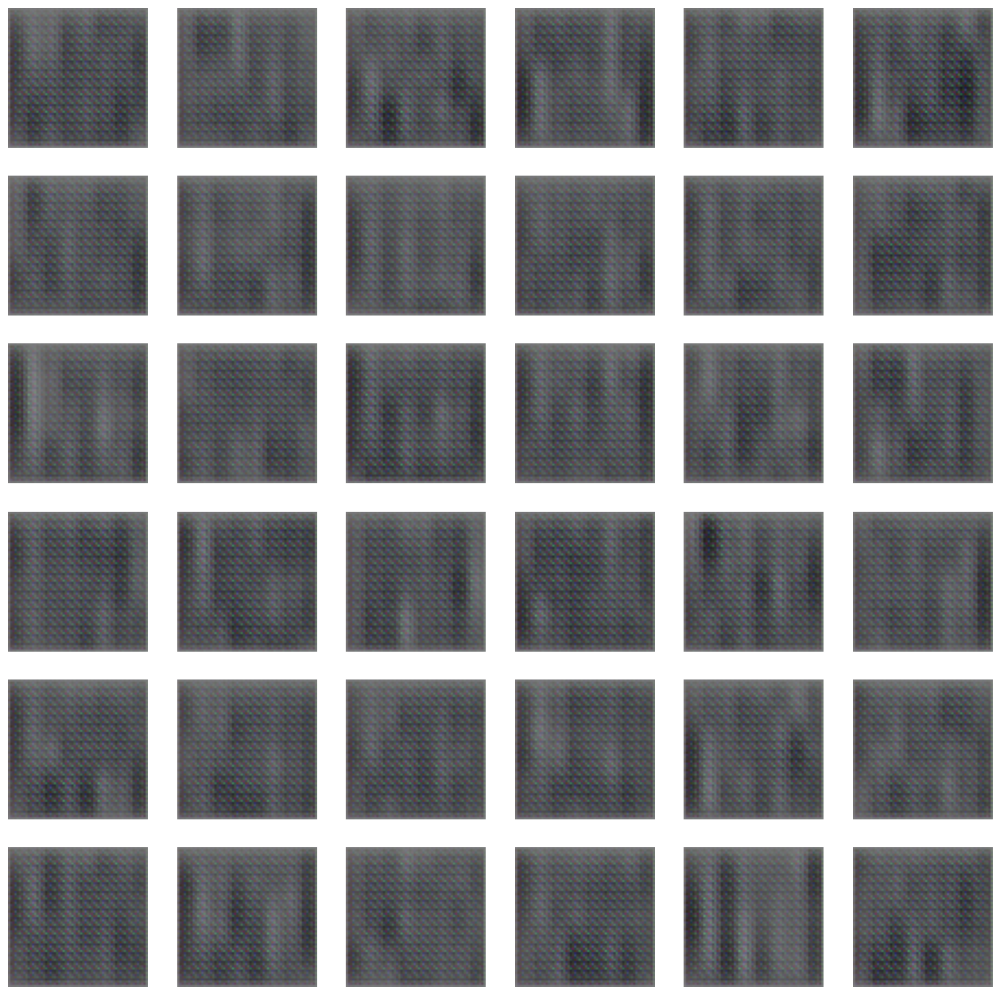

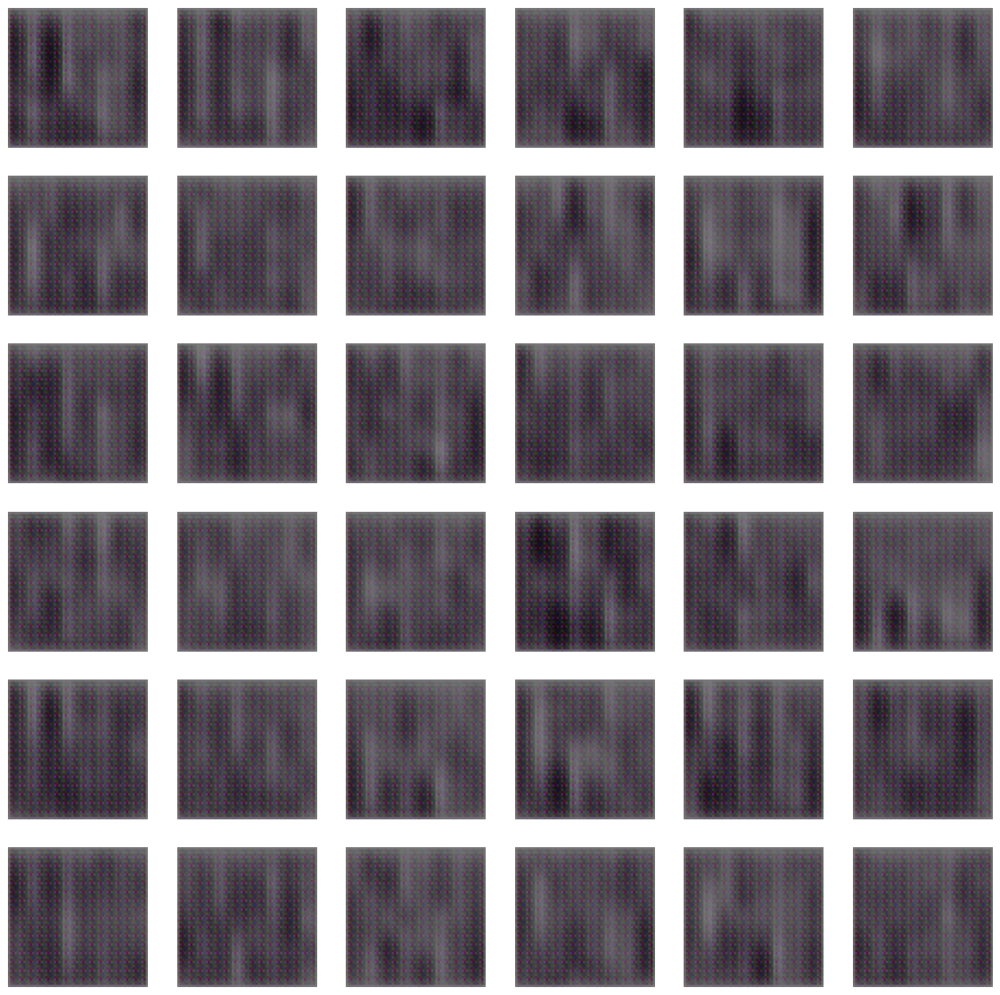

In [ ]:
EPOCHS = 1000
history = gan.fit(train_dataset, epochs=EPOCHS, callbacks=[ShowImage(LATENT_DIM)], verbose=0)

In [ ]:
%cd /content

/content


In [ ]:
!zip -r generated.zip generated/

  adding: generated/ (stored 0%)
  adding: generated/gen_images_epoch_561.png (deflated 1%)
  adding: generated/gen_images_epoch_891.png (deflated 1%)
  adding: generated/gen_images_epoch_551.png (deflated 1%)
  adding: generated/gen_images_epoch_589.png (deflated 1%)
  adding: generated/gen_images_epoch_718.png (deflated 1%)
  adding: generated/gen_images_epoch_110.png (deflated 1%)
  adding: generated/gen_images_epoch_934.png (deflated 1%)
  adding: generated/gen_images_epoch_209.png (deflated 1%)
  adding: generated/gen_images_epoch_356.png (deflated 1%)
  adding: generated/gen_images_epoch_267.png (deflated 1%)
  adding: generated/gen_images_epoch_717.png (deflated 1%)
  adding: generated/gen_images_epoch_315.png (deflated 1%)
  adding: generated/gen_images_epoch_28.png (deflated 1%)
  adding: generated/gen_images_epoch_790.png (deflated 1%)
  adding: generated/gen_images_epoch_596.png (deflated 1%)
  adding: generated/gen_images_epoch_233.png (deflated 1%)
  adding: generated/gen_

In [ ]:
from google.colab import files
files.download('generated.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp generated.zip /content/drive/My\ Drive/

In [ ]:
gan.save_weights("/content/gan_weights.h5")

In [ ]:
generator.save("/content/generator_model.h5")
discriminator.save("/content/discriminator_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


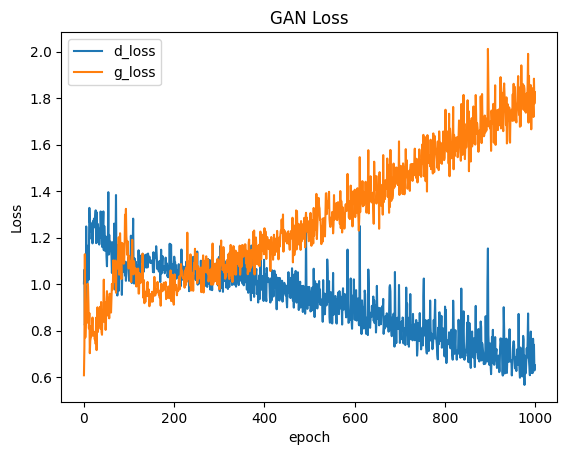

In [ ]:

plt.plot(history.history['d_loss'])
plt.plot(history.history['g_loss'])
plt.title('GAN Loss')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['d_loss', 'g_loss'], loc='upper left')
plt.show()